In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
import folium
import json
from scipy.stats import pearsonr

In [89]:
file_path = "C:/Users/vehico/Documents/Thesis/Distance-project/aggregated_school_distances_weighted.csv"

df = pd.read_csv(file_path)
df = df.drop(columns=[
    'IC_mean_km', 'IC_St.Dv_km', 'IC_mean_min', 'IC_St.Dv_min'
])

df.rename(columns={
    'Comune': 'Municipality',
    'Nucleo_ID': 'UrbanCentre_ID',
    'Popolazione': 'Population',
    'SI_mean_km': 'Kindergarten_mean_km',
    'SI_St.Dv_km': 'Kindergarten_std_km',
    'SI_mean_min': 'Kindergarten_mean_min',
    'SI_St.Dv_min': 'Kindergarten_std_min',
    'SP_mean_km': 'Primary_mean_km',
    'SP_St.Dv_km': 'Primary_std_km',
    'SP_mean_min': 'Primary_mean_min',
    'SP_St.Dv_min': 'Primary_std_min',
    'SS_mean_km': 'Secondary_mean_km',
    'SS_St.Dv_km': 'Secondary_std_km',
    'SS_mean_min': 'Secondary_mean_min',
    'SS_St.Dv_min': 'Secondary_std_min'
}, inplace=True)


In [90]:
df.columns.tolist()

['Municipality',
 'UrbanCentre_ID',
 'Population',
 'Kindergarten_mean_km',
 'Kindergarten_std_km',
 'Kindergarten_mean_min',
 'Kindergarten_std_min',
 'Primary_mean_km',
 'Primary_std_km',
 'Primary_mean_min',
 'Primary_std_min',
 'Secondary_mean_km',
 'Secondary_std_km',
 'Secondary_mean_min',
 'Secondary_std_min']

In [30]:
df.head()

,Municipality,UrbanCentre_ID,Population,Kindergarten_mean_km,Kindergarten_std_km,Kindergarten_mean_min,Kindergarten_std_min,Primary_mean_km,Primary_std_km,Primary_mean_min,Primary_std_min,Secondary_mean_km,Secondary_std_km,Secondary_mean_min,Secondary_std_min
0,POZZAGLIA SABINA,5.705810e+09,48.0,14.463000,NaN,20.233333,NaN,14.3760,NaN,21.300000,NaN,13.952000,NaN,20.216667,NaN
1,POZZAGLIA SABINA,5.705810e+09,39.0,17.806000,NaN,25.633333,NaN,17.7190,NaN,26.133333,NaN,17.295000,NaN,24.866667,NaN
2,POZZAGLIA SABINA,5.705820e+09,79.0,10.142000,NaN,14.483333,NaN,10.0550,NaN,14.816667,NaN,9.631000,NaN,13.700000,NaN
3,POZZAGLIA SABINA,5.705810e+09,136.0,11.745000,NaN,16.300000,NaN,11.6580,NaN,16.966667,NaN,11.234000,NaN,15.933333,NaN
4,RIETI,5.705910e+09,55.0,11.560571,3.262404,18.284524,4.119857,16.2702,15.439349,22.770000,15.739641,16.475714,19.184677,23.033333,19.783691


In [91]:
df_kindergarten = df[[
    'Municipality', 'UrbanCentre_ID', 'Population',
    'Kindergarten_mean_km', 'Kindergarten_std_km',
    'Kindergarten_mean_min', 'Kindergarten_std_min'
]]
df_kindergarten.head()

,Municipality,UrbanCentre_ID,Population,Kindergarten_mean_km,Kindergarten_std_km,Kindergarten_mean_min,Kindergarten_std_min
0,POZZAGLIA SABINA,5.705810e+09,48.0,14.463000,NaN,20.233333,NaN
1,POZZAGLIA SABINA,5.705810e+09,39.0,17.806000,NaN,25.633333,NaN
2,POZZAGLIA SABINA,5.705820e+09,79.0,10.142000,NaN,14.483333,NaN
3,POZZAGLIA SABINA,5.705810e+09,136.0,11.745000,NaN,16.300000,NaN
4,RIETI,5.705910e+09,55.0,11.560571,3.262404,18.284524,4.119857


In [92]:
df_primary = df[[
    'Municipality', 'UrbanCentre_ID', 'Population',
    'Primary_mean_km', 'Primary_std_km',
    'Primary_mean_min', 'Primary_std_min'
]]
df_primary.head()

,Municipality,UrbanCentre_ID,Population,Primary_mean_km,Primary_std_km,Primary_mean_min,Primary_std_min
0,POZZAGLIA SABINA,5.705810e+09,48.0,14.3760,NaN,21.300000,NaN
1,POZZAGLIA SABINA,5.705810e+09,39.0,17.7190,NaN,26.133333,NaN
2,POZZAGLIA SABINA,5.705820e+09,79.0,10.0550,NaN,14.816667,NaN
3,POZZAGLIA SABINA,5.705810e+09,136.0,11.6580,NaN,16.966667,NaN
4,RIETI,5.705910e+09,55.0,16.2702,15.439349,22.770000,15.739641


In [93]:
df_secondary = df[[
    'Municipality', 'UrbanCentre_ID', 'Population',
    'Secondary_mean_km', 'Secondary_std_km',
    'Secondary_mean_min', 'Secondary_std_min'
]]
df_secondary.head()

,Municipality,UrbanCentre_ID,Population,Secondary_mean_km,Secondary_std_km,Secondary_mean_min,Secondary_std_min
0,POZZAGLIA SABINA,5.705810e+09,48.0,13.952000,NaN,20.216667,NaN
1,POZZAGLIA SABINA,5.705810e+09,39.0,17.295000,NaN,24.866667,NaN
2,POZZAGLIA SABINA,5.705820e+09,79.0,9.631000,NaN,13.700000,NaN
3,POZZAGLIA SABINA,5.705810e+09,136.0,11.234000,NaN,15.933333,NaN
4,RIETI,5.705910e+09,55.0,16.475714,19.184677,23.033333,19.783691


In [94]:
# Create a list of dataframes and labels
school_levels = [
    ('Kindergarten', df_kindergarten, 'Kindergarten_mean_km', 'Kindergarten_mean_min'),
    ('Primary', df_primary, 'Primary_mean_km', 'Primary_mean_min'),
    ('Secondary', df_secondary, 'Secondary_mean_km', 'Secondary_mean_min')
]

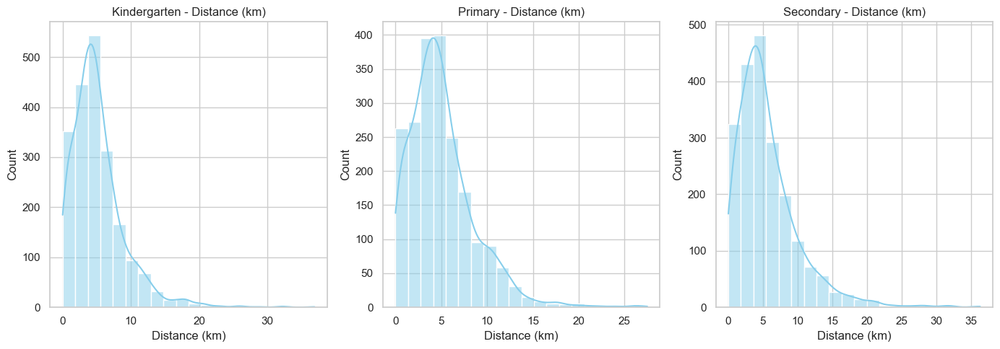

In [95]:
# Plot histograms for distances (km)

sns.set(style="whitegrid")

plt.figure(figsize=(14, 5))
for i, (label, df_level, dist_km, _) in enumerate(school_levels):
    plt.subplot(1, 3, i+1)
    sns.histplot(df_level[dist_km], bins=20, kde=True, color='skyblue')
    plt.title(f'{label} - Distance (km)')
    plt.xlabel('Distance (km)')
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

In [96]:
for label, df_level, dist_km, dist_min in school_levels:
    print(f"\n📚 {label} school statistics")
    print("Distance (km):")
    print(df_level[dist_km].describe())


📚 Kindergarten school statistics
Distance (km):
count    2068.000000
mean        5.186154
std         3.911068
min         0.002000
25%         2.699143
50%         4.472500
75%         6.734350
max        36.868000
Name: Kindergarten_mean_km, dtype: float64

📚 Primary school statistics
Distance (km):
count    2069.000000
mean        5.076077
std         3.585043
min         0.002000
25%         2.670000
50%         4.457000
75%         6.677500
max        27.482100
Name: Primary_mean_km, dtype: float64

📚 Secondary school statistics
Distance (km):
count    2067.000000
mean        5.687954
std         4.521791
min         0.000000
25%         2.731500
50%         4.667667
75%         7.444000
max        36.357000
Name: Secondary_mean_km, dtype: float64


## 📈 Observations on average distances (in km)

Distances are short on average for all school levels: averages range from ~5.1 km (nursery and primary) to 5.7 km for secondary schools. 

Secondary schools are slightly further away, both on average and in terms of maximum values. 

It also has the greatest variability. Distribution centred below 7 km: The 75th percentile remains below 7.5 km for everyone, indicating good accessibility in 75% of cases.

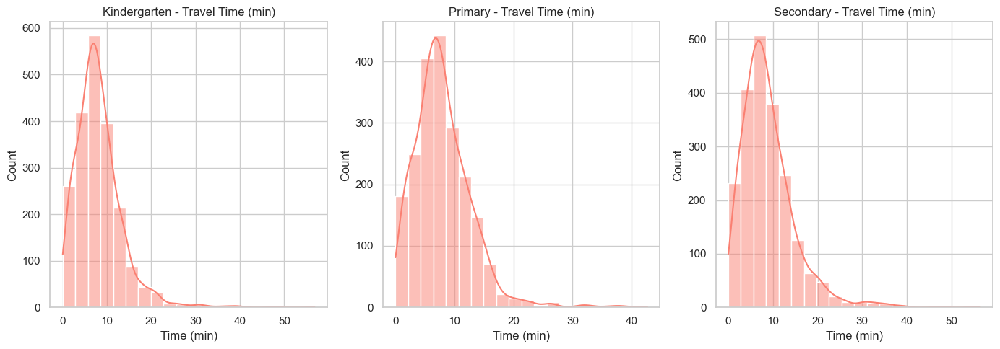

In [97]:
# Plot histograms for travel times (min)

sns.set(style="whitegrid")

plt.figure(figsize=(14, 5))
for i, (label, df_level, _, dist_min) in enumerate(school_levels):
    plt.subplot(1, 3, i+1)
    sns.histplot(df_level[dist_min], bins=20, kde=True, color='salmon')
    plt.title(f'{label} - Travel Time (min)')
    plt.xlabel('Time (min)')
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

In [ ]:
# Descriptive statistics for distances and travel times
for label, df_level, dist_km, dist_min in school_levels:
    print(f"\n📚 {label} school statistics")
    print("\nTime (min):")
    print(df_level[dist_min].describe())


📚 Kindergarten school statistics

Time (min):
count    2068.000000
mean        8.142520
std         5.278745
min         0.000000
25%         4.816667
50%         7.399167
75%        10.450000
max        56.850000
Name: Kindergarten_mean_min, dtype: float64

📚 Primary school statistics

Time (min):
count    2069.000000
mean        8.007477
std         4.939563
min         0.000000
25%         4.816667
50%         7.316667
75%        10.527778
max        42.683333
Name: Primary_mean_min, dtype: float64

📚 Secondary school statistics

Time (min):
count    2067.000000
mean        8.932809
std         6.057486
min         0.000000
25%         4.966667
50%         7.783333
75%        11.591667
max        56.433333
Name: Secondary_mean_min, dtype: float64


## 📈 Observations on average distances (in min)

Very low average times: All median values are below 8 minutes.

Secondary school takes longer to reach, consistent with the greater distance seen above.

Possible outliers above 40 minutes, but the maximums are still realistic.

The standard deviation is low, indicating a fairly concentrated and uniform distribution in most cases.

In [ ]:
# Function to print rankings
def print_accessibility_rankings(df, label, dist_col, time_col):
    print(f"\n🏫 {label.upper()} SCHOOL ACCESSIBILITY\n")

    # Best 5 by distance
    print("✅ Best 5 (Shortest Distance):")
    print(df[['Municipality', 'UrbanCentre_ID', dist_col]].sort_values(by=dist_col).head(5).to_string(index=False))

    # Worst 5 by distance
    print("\n❌ Worst 5 (Longest Distance):")
    print(df[['Municipality', 'UrbanCentre_ID',dist_col]].sort_values(by=dist_col, ascending=False).head(5).to_string(index=False))

    # Best 5 by time
    print("\n✅ Best 5 (Shortest Time):")
    print(df[['Municipality', 'UrbanCentre_ID',time_col]].sort_values(by=time_col).head(5).to_string(index=False))

    # Worst 5 by time
    print("\n❌ Worst 5 (Longest Time):")
    print(df[['Municipality', 'UrbanCentre_ID',time_col]].sort_values(by=time_col, ascending=False).head(5).to_string(index=False))

In [100]:
# Call the function for each school level
print_accessibility_rankings(
    df_kindergarten,
    "Kindergarten",
    "Kindergarten_mean_km",
    "Kindergarten_mean_min"
)


🏫 KINDERGARTEN SCHOOL ACCESSIBILITY

✅ Best 5 (Shortest Distance):
    Municipality  UrbanCentre_ID  Kindergarten_mean_km
        PROSSEDI    5902010002.0                 0.002
         BOMARZO    5600910001.0                 0.011
  POGGIO BUSTONE    5705110001.0                 0.011
BARBARANO ROMANO    5600410001.0                 0.016
         AUSONIA    6001210001.0                 0.019

❌ Worst 5 (Longest Distance):
   Municipality  UrbanCentre_ID  Kindergarten_mean_km
COLLALTO SABINO    5701820001.0                36.868
        NESPOLO    5704610001.0                32.361
 CAMERATA NUOVA    5801410001.0                31.990
        TURANIA    5707110001.0                28.623
COLLALTO SABINO    5701810001.0                26.411

✅ Best 5 (Shortest Time):
    Municipality  UrbanCentre_ID  Kindergarten_mean_min
  POGGIO BUSTONE    5705110001.0               0.000000
        PROSSEDI    5902010002.0               0.000000
BARBARANO ROMANO    5600410001.0               0.016

In [101]:
print_accessibility_rankings(
    df_primary,
    "Primary",
    "Primary_mean_km",
    "Primary_mean_min"
)


🏫 PRIMARY SCHOOL ACCESSIBILITY

✅ Best 5 (Shortest Distance):
        Municipality  UrbanCentre_ID  Primary_mean_km
            PROSSEDI    5902010002.0            0.002
           CORCHIANO    5602310001.0            0.023
TORRICELLA IN SABINA    5706910004.0            0.025
           GALLINARO    6004010001.0            0.054
            BELLEGRA    5801210001.0            0.054

❌ Worst 5 (Longest Distance):
  Municipality  UrbanCentre_ID  Primary_mean_km
         RIETI    5705910010.0          27.4821
PESCOROCCHIANO    5704910016.0          26.3910
         RIETI    5705910019.0          26.3237
         TOLFA    5810510001.0          25.7335
         RIETI    5705910014.0          24.1113

✅ Best 5 (Shortest Time):
        Municipality  UrbanCentre_ID  Primary_mean_min
            PROSSEDI    5902010002.0          0.000000
TORRICELLA IN SABINA    5706910004.0          0.033333
           CORCHIANO    5602310001.0          0.050000
           GALLINARO    6004010001.0          0

In [102]:
print_accessibility_rankings(
    df_secondary,
    "Secondary",
    "Secondary_mean_km",
    "Secondary_mean_min"
)


🏫 SECONDARY SCHOOL ACCESSIBILITY

✅ Best 5 (Shortest Distance):
    Municipality  UrbanCentre_ID  Secondary_mean_km
CANALE MONTERANO    5801610001.0              0.000
          ARSOLI    5801010001.0              0.025
CARPINETO ROMANO    5802010001.0              0.025
       GAVIGNANO    5804110001.0              0.032
          VEJANO    5605610001.0              0.041

❌ Worst 5 (Longest Distance):
                Municipality  UrbanCentre_ID  Secondary_mean_km
             COLLALTO SABINO    5701820001.0             36.357
                  COLLEGIOVE    5702010001.0             35.952
              CAMERATA NUOVA    5801410001.0             31.990
MONTE SAN GIOVANNI IN SABINA    5704326601.0             31.895
                     NESPOLO    5704610001.0             31.850

✅ Best 5 (Shortest Time):
    Municipality  UrbanCentre_ID  Secondary_mean_min
CANALE MONTERANO    5801610001.0            0.000000
CARPINETO ROMANO    5802010001.0            0.050000
       GAVIGNANO    58

In [103]:
# Melt distance columns
df_distance_long = df.melt(
    id_vars=['Municipality', 'UrbanCentre_ID'],
    value_vars=['Kindergarten_mean_km', 'Primary_mean_km', 'Secondary_mean_km'],
    var_name='School_Level',
    value_name='Distance_km'
)

# Melt time columns
df_time_long = df.melt(
    id_vars=['Municipality', 'UrbanCentre_ID'],
    value_vars=['Kindergarten_mean_min', 'Primary_mean_min', 'Secondary_mean_min'],
    var_name='School_Level',
    value_name='Time_min'
)

# Harmonize school level labels
df_distance_long['School_Level'] = df_distance_long['School_Level'].str.replace('_mean_km', '')
df_time_long['School_Level'] = df_time_long['School_Level'].str.replace('_mean_min', '')

# Merge distances and times
df_long = pd.merge(
    df_distance_long,
    df_time_long,
    on=['Municipality', 'UrbanCentre_ID', 'School_Level']
)

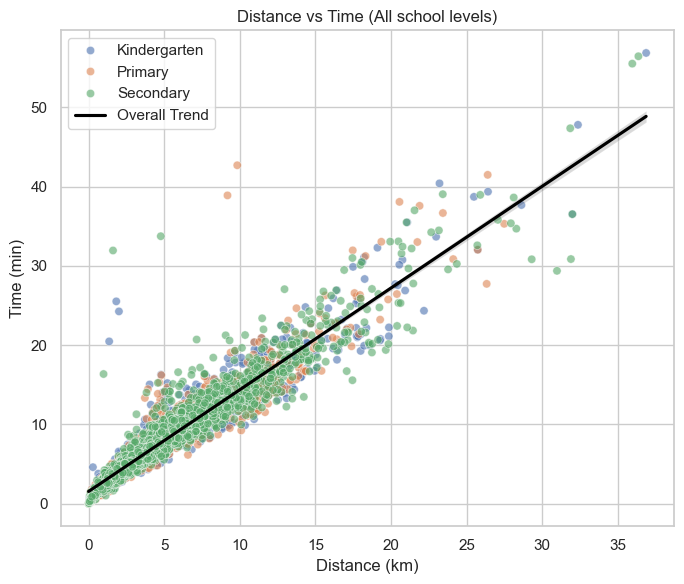

In [104]:
plt.figure(figsize=(7, 6))
sns.scatterplot(data=df_long, x='Distance_km', y='Time_min', hue='School_Level', alpha=0.6)
sns.regplot(data=df_long, x='Distance_km', y='Time_min', scatter=False, color='black', label='Overall Trend')
plt.title("Distance vs Time (All school levels)")
plt.xlabel("Distance (km)")
plt.ylabel("Time (min)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [105]:
# Drop rows with NaN in either column
df_corr = df_long[['Distance_km', 'Time_min']].dropna()

# Now compute Pearson correlation
r_all, pval_all = pearsonr(df_corr['Distance_km'], df_corr['Time_min'])
print(f"🔗 Overall Pearson correlation: r = {r_all:.3f} (p-value = {pval_all:.3e})")

🔗 Overall Pearson correlation: r = 0.948 (p-value = 0.000e+00)


In [106]:
# Drop missing
df_clean = df_long.dropna(subset=['Distance_km', 'Time_min'])

# Fit linear model
X = df_clean[['Distance_km']]
y = df_clean['Time_min']
model = LinearRegression().fit(X, y)
y_pred = model.predict(X)

# Add residuals to the DataFrame
df_clean['Residual'] = y - y_pred
df_clean['AbsResidual'] = np.abs(df_clean['Residual'])

C:\Users\vehico\AppData\Local\Temp\ipykernel_4924\3203060268.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Residual'] = y - y_pred
C:\Users\vehico\AppData\Local\Temp\ipykernel_4924\3203060268.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['AbsResidual'] = np.abs(df_clean['Residual'])


In [107]:
# Sort by absolute residual
top_outliers = df_clean.sort_values(by='AbsResidual', ascending=False).head(20)

# Show relevant columns
print("🚨 Top 10 outliers (based on time vs distance residual):")
print(top_outliers[['Municipality', 'UrbanCentre_ID', 'School_Level', 'Distance_km', 'Time_min', 'Residual']])

🚨 Top 10 outliers (based on time vs distance residual):
                      Municipality  UrbanCentre_ID  School_Level  Distance_km  \
2128                   STIMIGLIANO    5.706627e+09       Primary     9.829000   
4195                   STIMIGLIANO    5.706610e+09     Secondary     1.612000   
4196                   STIMIGLIANO    5.706620e+09     Secondary     4.772000   
2125                   STIMIGLIANO    5.706610e+09       Primary     9.183000   
58                     STIMIGLIANO    5.706620e+09  Kindergarten     1.828000   
59                     STIMIGLIANO    5.706627e+09  Kindergarten     2.005000   
56                     STIMIGLIANO    5.706610e+09  Kindergarten     1.359000   
4197                   STIMIGLIANO    5.706627e+09     Secondary     0.987000   
5025  MONTE SAN GIOVANNI IN SABINA    5.704320e+09     Secondary    30.973000   
5028  MONTE SAN GIOVANNI IN SABINA    5.704327e+09     Secondary    31.895000   
2936                    MARCETELLI    5.703610e+09   

In [108]:
# Load the dataset (modifica il path se lavori in Jupyter su un altro sistema operativo)
file_path = r"C:/Users/vehico/Documents/Thesis/Distance-project/aggregati_municipio.csv"
df_municipal = pd.read_csv(file_path)

# Rename columns to English
df_municipal.rename(columns={
    'Comune': 'Municipality',
    'Popolazione_totale': 'Total_Population',
    'SI_mean_km': 'Kindergarten_mean_km',
    'SP_mean_km': 'Primary_mean_km',
    'SS_mean_km': 'Secondary_mean_km',
    'SI_mean_min': 'Kindergarten_mean_min',
    'SP_mean_min': 'Primary_mean_min',
    'SS_mean_min': 'Secondary_mean_min',
    'SI_St.Dv_km': 'Kindergarten_std_km',
    'SP_St.Dv_km': 'Primary_std_km',
    'SS_St.Dv_km': 'Secondary_std_km',
    'SI_St.Dv_min': 'Kindergarten_std_min',
    'SP_St.Dv_min': 'Primary_std_min',
    'SS_St.Dv_min': 'Secondary_std_min'
}, inplace=True)

In [109]:
# Kindergarten-level indicators by municipality
df_municipal_kindergarten = df_municipal[[
    'Municipality', 'Total_Population',
    'Kindergarten_mean_km', 'Kindergarten_mean_min',
    'Kindergarten_std_km', 'Kindergarten_std_min'
]]
df_municipal_kindergarten.head()

,Municipality,Total_Population,Kindergarten_mean_km,Kindergarten_mean_min,Kindergarten_std_km,Kindergarten_std_min
0,ACCUMOLI,369.0,4.913220,7.364995,4.768209,6.405264
1,ACQUAFONDATA,249.0,5.072522,8.566533,2.240821,3.759451
2,ACQUAPENDENTE,4502.0,2.006520,4.685777,6.573614,7.557831
3,ACUTO,1766.0,0.877558,2.433484,1.723996,2.567983
4,AFFILE,1325.0,0.292473,0.765321,5.804640,8.320290


In [110]:
# Primary school indicators
df_municipal_primary = df_municipal[[
    'Municipality', 'Total_Population',
    'Primary_mean_km', 'Primary_mean_min',
    'Primary_std_km', 'Primary_std_min'
]]
df_municipal_primary.head()

,Municipality,Total_Population,Primary_mean_km,Primary_mean_min,Primary_std_km,Primary_std_min
0,ACCUMOLI,369.0,4.913220,7.364995,4.768209,6.405264
1,ACQUAFONDATA,249.0,5.448522,9.149866,2.240821,3.759451
2,ACQUAPENDENTE,4502.0,1.715522,3.032663,6.888247,8.427703
3,ACUTO,1766.0,0.877558,2.433484,1.723996,2.567983
4,AFFILE,1325.0,0.521448,1.455887,1.453812,2.427733


In [78]:
# Secondary school indicators
df_municipal_secondary = df_municipal[[
    'Municipality', 'Total_Population',
    'Secondary_mean_km', 'Secondary_mean_min',
    'Secondary_std_km', 'Secondary_std_min'
]]
df_municipal_secondary.head()

,Municipality,Total_Population,Secondary_mean_km,Secondary_mean_min,Secondary_std_km,Secondary_std_min
0,ACCUMOLI,369.0,14.299333,17.643360,3.863249,5.097948
1,ACQUAFONDATA,249.0,10.201438,17.298260,2.760545,4.855467
2,ACQUAPENDENTE,4502.0,2.261520,5.408389,6.573614,7.686093
3,ACUTO,1766.0,0.877558,2.433484,1.723996,2.567983
4,AFFILE,1325.0,0.521448,1.455887,1.453812,2.427733


In [111]:
def print_municipality_rankings(df, level_label, dist_col, time_col):
    print(f"\n🏛️ {level_label.upper()} ACCESSIBILITY - BY MUNICIPALITY")

    # Best 5 by distance
    print("\n✅ Best 5 (Shortest Distance):")
    print(df[['Municipality', dist_col]].sort_values(by=dist_col).head(5).to_string(index=False))

    # Worst 5 by distance
    print("\n❌ Worst 5 (Longest Distance):")
    print(df[['Municipality', dist_col]].sort_values(by=dist_col, ascending=False).head(5).to_string(index=False))

    # Best 5 by time
    print("\n✅ Best 5 (Shortest Time):")
    print(df[['Municipality', time_col]].sort_values(by=time_col).head(5).to_string(index=False))

    # Worst 5 by time
    print("\n❌ Worst 5 (Longest Time):")
    print(df[['Municipality', time_col]].sort_values(by=time_col, ascending=False).head(5).to_string(index=False))

In [147]:
# Kindergarten
print_municipality_rankings(
    df_municipal_kindergarten,
    "Kindergarten",
    "Kindergarten_mean_km",
    "Kindergarten_mean_min"
)


🏛️ KINDERGARTEN ACCESSIBILITY - BY MUNICIPALITY

✅ Best 5 (Shortest Distance):
       Municipality  Kindergarten_mean_km
ROCCA SANTO STEFANO              0.046000
             VEJANO              0.049000
    COLLE SAN MAGNO              0.086000
          CORCHIANO              0.092617
    MAGLIANO ROMANO              0.140000

❌ Worst 5 (Longest Distance):
   Municipality  Kindergarten_mean_km
        NESPOLO             32.361000
 CAMERATA NUOVA             31.990000
        TURANIA             28.623000
COLLALTO SABINO             27.478041
     COLLEGIOVE             25.481000

✅ Best 5 (Shortest Time):
       Municipality  Kindergarten_mean_min
             VEJANO               0.150000
    COLLE SAN MAGNO               0.166667
          CORCHIANO               0.174450
ROCCA SANTO STEFANO               0.233333
    MAGLIANO ROMANO               0.233333

❌ Worst 5 (Longest Time):
   Municipality  Kindergarten_mean_min
        NESPOLO              47.783333
COLLALTO SABINO    

In [113]:
# Primary
print_municipality_rankings(
    df_municipal_primary,
    "Primary",
    "Primary_mean_km",
    "Primary_mean_min"
)



🏛️ PRIMARY ACCESSIBILITY - BY MUNICIPALITY

✅ Best 5 (Shortest Distance):
   Municipality  Primary_mean_km
COLLE SAN MAGNO         0.086000
      CORCHIANO         0.092617
      FILETTINO         0.095000
 CAMERATA NUOVA         0.128000
      PISONIANO         0.131000

❌ Worst 5 (Longest Distance):
Municipality  Primary_mean_km
  MARCETELLI        20.556000
VARCO SABINO        18.483241
       JENNE        15.297000
      ASCREA        14.944471
 VALLEPIETRA        14.686000

✅ Best 5 (Shortest Time):
    Municipality  Primary_mean_min
 COLLE SAN MAGNO          0.166667
       CORCHIANO          0.174450
       FILETTINO          0.233333
COLLI SUL VELINO          0.266667
         TERELLE          0.466667

❌ Worst 5 (Longest Time):
Municipality  Primary_mean_min
  MARCETELLI         38.066667
VARCO SABINO         31.485057
 STIMIGLIANO         27.787923
      ASCREA         27.486398
       JENNE         23.983333


In [114]:
# Secondary
print_municipality_rankings(
    df_municipal_secondary,
    "Secondary",
    "Secondary_mean_km",
    "Secondary_mean_min"
)


🏛️ SECONDARY ACCESSIBILITY - BY MUNICIPALITY

✅ Best 5 (Shortest Distance):
       Municipality  Secondary_mean_km
             ARSOLI              0.025
   CARPINETO ROMANO              0.025
             VEJANO              0.041
ROCCA SANTO STEFANO              0.092
          PISONIANO              0.131

❌ Worst 5 (Longest Distance):
   Municipality  Secondary_mean_km
     COLLEGIOVE          35.952000
 CAMERATA NUOVA          31.990000
        NESPOLO          31.850000
        TURANIA          28.112000
COLLALTO SABINO          26.967041

✅ Best 5 (Shortest Time):
           Municipality  Secondary_mean_min
       CARPINETO ROMANO            0.050000
                 ARSOLI            0.116667
                 VEJANO            0.316667
           FIANO ROMANO            0.383333
SAN GREGORIO DA SASSOLA            0.483333

❌ Worst 5 (Longest Time):
   Municipality  Secondary_mean_min
     COLLEGIOVE           55.500000
        NESPOLO           47.350000
COLLALTO SABINO       

## Objective

To evaluate whether aggregating accessibility indicators at the municipality level preserves the same ranking trends observed at the urban centre level. This helps assess whether the aggregation masks important disparities.

In [121]:
def compare_rankings_by_level(df_nuclei, df_municipal, level_label):
    """
    Compare accessibility rankings between urban centre averages and municipality aggregates.
    
    Parameters:
        df_nuclei: original dataset with all urban centres
        df_municipal: dataset aggregated at municipality level
        level_label: school level to analyze ("Kindergarten", "Primary", or "Secondary")
    """
    # Define relevant columns
    dist_col_nuclei = f'{level_label}_mean_km'
    time_col_nuclei = f'{level_label}_mean_min'
    
    # Step 1 - Rank per urban centre
    rank_nuclei = df_nuclei[['Municipality', 'UrbanCentre_ID', dist_col_nuclei, time_col_nuclei]].copy()
    rank_nuclei['Rank_km_nuclei'] = rank_nuclei[dist_col_nuclei].rank(method='min')
    rank_nuclei['Rank_min_nuclei'] = rank_nuclei[time_col_nuclei].rank(method='min')
    
    # Step 2 - Average rank per municipality
    rank_nuclei_avg = rank_nuclei.groupby('Municipality')[['Rank_km_nuclei', 'Rank_min_nuclei']].mean().reset_index()
    
    # Step 3 - Rank per municipality (aggregated)
    dist_col_mun = dist_col_nuclei
    time_col_mun = time_col_nuclei
    rank_municipal = df_municipal[['Municipality', dist_col_mun, time_col_mun]].copy()
    rank_municipal['Rank_km_municipal'] = rank_municipal[dist_col_mun].rank(method='min')
    rank_municipal['Rank_min_municipal'] = rank_municipal[time_col_mun].rank(method='min')
    
    # Step 4 - Merge and calculate differences
    df_rank_compare = pd.merge(rank_municipal, rank_nuclei_avg, on='Municipality')
    df_rank_compare['Diff_rank_km'] = df_rank_compare['Rank_km_municipal'] - df_rank_compare['Rank_km_nuclei']
    df_rank_compare['Diff_rank_min'] = df_rank_compare['Rank_min_municipal'] - df_rank_compare['Rank_min_nuclei']
    df_rank_compare['Abs_diff_km'] = df_rank_compare['Diff_rank_km'].abs()
    df_rank_compare['Abs_diff_min'] = df_rank_compare['Diff_rank_min'].abs()
    
    print(f"\n🔍 {level_label.upper()} - TOP 10 Divergences in DISTANCE ranking")
    print(df_rank_compare[['Municipality', 'Diff_rank_km', 'Rank_km_municipal', 'Rank_km_nuclei', 'Abs_diff_km']]
          .sort_values(by='Abs_diff_km', ascending=False).head(10))

    print(f"\n🔍 {level_label.upper()} - TOP 10 Divergences in TIME ranking")
    print(df_rank_compare[['Municipality', 'Diff_rank_min', 'Rank_min_municipal', 'Rank_min_nuclei', 'Abs_diff_min']]
          .sort_values(by='Abs_diff_min', ascending=False).head(10))
    
    return df_rank_compare


In [122]:
# Kindergarten
df_rank_kindergarten = compare_rankings_by_level(df, df_municipal_kindergarten, "Kindergarten")


🔍 KINDERGARTEN - TOP 10 Divergences in DISTANCE ranking
        Municipality  Diff_rank_km  Rank_km_municipal  Rank_km_nuclei  \
102  COLLALTO SABINO  -1704.000000              362.0     2066.000000   
337          TURANIA  -1702.000000              363.0     2065.000000   
214          NESPOLO  -1702.000000              365.0     2067.000000   
46    CAMERATA NUOVA  -1702.000000              364.0     2066.000000   
179       MARCETELLI  -1701.000000              360.0     2061.000000   
364    VIVARO ROMANO  -1701.000000              359.0     2060.000000   
106       COLLEGIOVE  -1701.000000              361.0     2062.000000   
346      VALLINFREDA  -1697.500000              358.0     2055.500000   
39           BORBONA  -1691.666667              357.0     2048.666667   
348     VARCO SABINO  -1672.333333              356.0     2028.333333   

     Abs_diff_km  
102  1704.000000  
337  1702.000000  
214  1702.000000  
46   1702.000000  
179  1701.000000  
364  1701.000000  
106  1

In [123]:
# Primary
df_rank_primary = compare_rankings_by_level(df, df_municipal_primary, "Primary")



🔍 PRIMARY - TOP 10 Divergences in DISTANCE ranking
         Municipality  Diff_rank_km  Rank_km_municipal  Rank_km_nuclei  \
179        MARCETELLI  -1695.000000              366.0     2061.000000   
348      VARCO SABINO  -1688.666667              365.0     2053.666667   
160             JENNE  -1675.000000              364.0     2039.000000   
343       VALLEPIETRA  -1672.000000              362.0     2034.000000   
258             RIETI  -1657.086957              354.0     2011.086957   
221           ORVINIO  -1657.000000              360.0     2017.000000   
337           TURANIA  -1648.000000              359.0     2007.000000   
253  POZZAGLIA SABINA  -1621.250000              358.0     1979.250000   
222   PAGANICO SABINO  -1609.000000              355.0     1964.000000   
48        CAMPODIMELE  -1604.000000              356.0     1960.000000   

     Abs_diff_km  
179  1695.000000  
348  1688.666667  
160  1675.000000  
343  1672.000000  
258  1657.086957  
221  1657.000000  


In [124]:
# Secondary
df_rank_secondary = compare_rankings_by_level(df, df_municipal_secondary, "Secondary")


🔍 SECONDARY - TOP 10 Divergences in DISTANCE ranking
                     Municipality  Diff_rank_km  Rank_km_municipal  \
106                    COLLEGIOVE  -1701.000000              365.0   
46                 CAMERATA NUOVA  -1701.000000              364.0   
102               COLLALTO SABINO  -1700.500000              361.0   
214                       NESPOLO  -1700.000000              363.0   
337                       TURANIA  -1697.000000              362.0   
194  MONTE SAN GIOVANNI IN SABINA  -1693.333333              359.0   
179                    MARCETELLI  -1692.000000              360.0   
169                       LICENZA  -1690.500000              357.0   
222               PAGANICO SABINO  -1687.000000              358.0   
39                        BORBONA  -1684.333333              352.0   

     Rank_km_nuclei  Abs_diff_km  
106     2066.000000  1701.000000  
46      2065.000000  1701.000000  
102     2061.500000  1700.500000  
214     2063.000000  1700.000000  


This analysis compares the accessibility rankings of municipalities when calculated using:
- Average indicators across all urban centres within each municipality;
- Aggregated indicators at the municipality level.

Results show that for several municipalities, there is a **significant mismatch** between the two rankings. In particular, some municipalities that rank **well at the aggregated level** perform **very poorly when examining individual urban centres**. 

For example, municipalities like *Collalto Sabino* and *Turania* rank around 360th (out of ~2070) when using aggregated data but rank near the bottom (2065+) based on urban centre-level averages. This indicates a difference of over 1700 positions in the rankings — a **massive divergence**.

### 📌 Conclusion:
Aggregated municipality-level indicators can **mask internal disparities** in accessibility. Therefore, accessibility assessments should maintain a **granular level of analysis**, such as the urban centre, to capture spatial inequality effectively. This is especially relevant for policy-making, as interventions based solely on municipal averages may fail to identify underserved populations.

The visual comparison between urban centre-level and municipality-level accessibility rankings shows a consistent pattern across all school levels and indicators. The majority of municipalities appear below the diagonal line, indicating that their aggregated rankings are better than the average rankings of their constituent urban centres.

This discrepancy reveals a systemic bias introduced by aggregation: **municipality-level data tend to mask intra-municipal disparities**, making overall accessibility seem better than it actually is when analyzed at finer spatial scales. The flattening of the ranking values confirms a loss of variability, highlighting the importance of preserving disaggregated units in accessibility assessments and policymaking.


In [129]:
# Kindergarten
print_top_disparity(df_municipal_kindergarten, "Kindergarten")



🚨 TOP 10 – KINDERGARTEN – INTERNAL DISPARITY (Distance)
   Municipality  Std_dev_km
          TOLFA   17.615444
     COLLEPARDO    8.017884
COLLALTO SABINO    7.394216
  ACQUAPENDENTE    6.573614
 PESCOROCCHIANO    6.062353
CERVARA DI ROMA    5.858320
  ROCCA DI PAPA    5.821898
         AFFILE    5.804640
ROCCA SINIBALDA    5.760804
          GAETA    5.392927

🚨 TOP 10 – KINDERGARTEN – INTERNAL DISPARITY (Time)
   Municipality  Std_dev_min
          TOLFA    21.401765
     COLLEPARDO    14.578185
COLLALTO SABINO    12.374369
CERVARA DI ROMA    10.056621
 PESCOROCCHIANO     9.724507
    STIMIGLIANO     9.647111
    CONCERVIANO     9.215958
         AFFILE     8.320290
          GORGA     8.072802
 LONGONE SABINO     8.072041


In [130]:
# Primary
print_top_disparity(df_municipal_primary, "Primary")


🚨 TOP 10 – PRIMARY – INTERNAL DISPARITY (Distance)
     Municipality  Std_dev_km
            TOLFA   17.615444
       COLLEPARDO    8.017884
           ASCREA    7.759083
  COLLALTO SABINO    7.599277
    ACQUAPENDENTE    6.888247
   PESCOROCCHIANO    6.717770
  ROCCA SINIBALDA    5.932485
    ROCCA DI PAPA    5.821898
  CERVARA DI ROMA    5.574936
MONTELEONE SABINO    5.443308

🚨 TOP 10 – PRIMARY – INTERNAL DISPARITY (Time)
   Municipality  Std_dev_min
          TOLFA    21.401765
     COLLEPARDO    14.578185
    STIMIGLIANO    14.009055
         ASCREA    13.729657
COLLALTO SABINO    12.845773
 PESCOROCCHIANO    10.912998
CERVARA DI ROMA     9.952819
    CONCERVIANO     9.215958
  ACQUAPENDENTE     8.427703
ROCCA SINIBALDA     8.367026


In [131]:
# Secondary
print_top_disparity(df_municipal_secondary, "Secondary")


🚨 TOP 10 – SECONDARY – INTERNAL DISPARITY (Distance)
      Municipality  Std_dev_km
             TOLFA   18.806919
   COLLALTO SABINO    7.394216
        COLLEPARDO    7.119858
     ACQUAPENDENTE    6.573614
MONTALTO DI CASTRO    6.251246
     ROCCA DI PAPA    6.084244
    PESCOROCCHIANO    6.044267
   ROCCA SINIBALDA    5.932485
    PETRELLA SALTO    5.860587
            ASCREA    5.506948

🚨 TOP 10 – SECONDARY – INTERNAL DISPARITY (Time)
     Municipality  Std_dev_min
            TOLFA    24.642671
      STIMIGLIANO    15.315733
  COLLALTO SABINO    12.362584
       COLLEPARDO    11.761543
   PESCOROCCHIANO     9.648027
      CONCERVIANO     9.215958
  ROCCA SINIBALDA     8.367026
MONTELEONE SABINO     8.108158
    ROCCA DI PAPA     7.791500
            GORGA     7.766389


The intra-municipal disparities in accessibility were assessed by analyzing the standard deviation of distances and travel times between urban centres within each municipality. High standard deviation values highlight cases where some urban centres have excellent access to services, while others are significantly disadvantaged. These municipalities exhibit the greatest internal inequalities and may require targeted interventions at the sub-municipal level.

The analysis of intra-municipal disparities was conducted by identifying the municipalities with the highest standard deviation of accessibility indicators among their constituent urban centres.
A high standard deviation in either travel distance or time indicates that some urban centres within the same municipality enjoy good accessibility to education services, while others are significantly disadvantaged.
These findings are crucial for fine-grained policy design, as they point to municipalities where inequity is internal rather than between municipalities. Such disparities are often masked when relying only on aggregated values.

In [137]:
# Carica il GeoJSON
geo_path = "C:/Users/vehico/Documents/Thesis/Distance-project/OpenLayers/my-openlayers-project/public/comuniLazio.geojson"  # cambia con il tuo file se necessario
with open(geo_path, encoding='utf-8') as f:
    comuni_geo = json.load(f)

# Scegli il DataFrame e la colonna da visualizzare
df_map = df_municipal_primary.copy()
value_column = 'Primary_std_km'

# Assicurati che i nomi dei comuni combacino (es. rimuovi eventuali MAIUSCOLE/MINUSCOLE)
df_map['Municipality'] = df_map['Municipality'].str.strip().str.lower()

for feature in comuni_geo['features']:
    feature['properties']['COMUNE'] = feature['properties']['COMUNE'].strip().lower()

# Crea la mappa
mappa = folium.Map(location=[41.89, 12.5], zoom_start=8, tiles='cartodbpositron')

# Aggiungi layer tematico
choropleth = folium.Choropleth(
    geo_data=comuni_geo,
    name="choropleth",
    data=df_map,
    columns=["Municipality", value_column],
    key_on="feature.properties.COMUNE",
    fill_color="YlOrRd",
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name="Internal Disparity (Primary school – km)",
    nan_fill_color='lightgray'
).add_to(mappa)

# Aggiungi layer control
folium.LayerControl().add_to(mappa)

# Mostra la mappa
mappa


In [138]:
# Estrai la mappatura Comune → Codice Provincia dal GeoJSON
prov_mapping = {
    feature['properties']['COMUNE'].strip().lower(): feature['properties']['COD_PROV']
    for feature in comuni_geo['features']
}

In [141]:
df_municipal_kindergarten['Province_Code'] = df_municipal_kindergarten['Municipality_clean'].map(prov_mapping)

df_municipal_primary['Province_Code'] = df_municipal_primary['Municipality_clean'].map(prov_mapping)

df_municipal_secondary['Province_Code'] = df_municipal_secondary['Municipality_clean'].map(prov_mapping)


C:\Users\vehico\AppData\Local\Temp\ipykernel_4924\1284260246.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_municipal_kindergarten['Province_Code'] = df_municipal_kindergarten['Municipality_clean'].map(prov_mapping)
C:\Users\vehico\AppData\Local\Temp\ipykernel_4924\1284260246.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_municipal_primary['Province_Code'] = df_municipal_primary['Municipality_clean'].map(prov_mapping)


In [142]:
def summarize_accessibility_by_province(df_municipal, level_label):
    """
    Aggregates average accessibility and disparity at the provincial level using population-weighted means.
    
    Returns a DataFrame with:
    - weighted average distance and time
    - standard deviation of municipality values (to measure inequality between municipalities)
    """
    dist_col = f"{level_label}_mean_km"
    time_col = f"{level_label}_mean_min"
    pop_col = "Total_Population"
    
    df_grouped = df_municipal.groupby("Province_Code").apply(
        lambda g: pd.Series({
            f'{level_label}_weighted_mean_km': (g[dist_col] * g[pop_col]).sum() / g[pop_col].sum(),
            f'{level_label}_weighted_mean_min': (g[time_col] * g[pop_col]).sum() / g[pop_col].sum(),
            f'{level_label}_std_among_municipalities_km': g[dist_col].std(),
            f'{level_label}_std_among_municipalities_min': g[time_col].std()
        })
    ).reset_index()
    
    return df_grouped


In [144]:
prov_summary_kg = summarize_accessibility_by_province(df_municipal_kindergarten, "Kindergarten")
prov_summary_kg

C:\Users\vehico\AppData\Local\Temp\ipykernel_4924\2722147001.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_grouped = df_municipal.groupby("Province_Code").apply(


,Province_Code,Kindergarten_weighted_mean_km,Kindergarten_weighted_mean_min,Kindergarten_std_among_municipalities_km,Kindergarten_std_among_municipalities_min
0,56,1.829134,3.353911,1.983109,2.485201
1,57,5.167905,8.491459,6.988945,10.109972
2,58,3.096008,6.294805,4.798385,6.663487
3,59,3.998859,7.073699,2.947584,4.035872
4,60,3.200324,6.034072,2.743745,4.177724


In [145]:
prov_summary_pr = summarize_accessibility_by_province(df_municipal_primary, "Primary")
prov_summary_pr

C:\Users\vehico\AppData\Local\Temp\ipykernel_4924\2722147001.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_grouped = df_municipal.groupby("Province_Code").apply(


,Province_Code,Primary_weighted_mean_km,Primary_weighted_mean_min,Primary_std_among_municipalities_km,Primary_std_among_municipalities_min
0,56,1.849665,3.396582,2.279504,2.854689
1,57,6.585389,9.995114,4.367330,7.478024
2,58,3.025889,5.952581,3.018396,4.559344
3,59,4.328489,7.232112,2.657134,3.211298
4,60,3.024464,5.776951,1.631649,2.729475


In [146]:
prov_summary_sc = summarize_accessibility_by_province(df_municipal_secondary, "Secondary")
prov_summary_sc

C:\Users\vehico\AppData\Local\Temp\ipykernel_4924\2722147001.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_grouped = df_municipal.groupby("Province_Code").apply(


,Province_Code,Secondary_weighted_mean_km,Secondary_weighted_mean_min,Secondary_std_among_municipalities_km,Secondary_std_among_municipalities_min
0,56,1.629069,3.260845,2.318418,2.984704
1,57,7.874080,11.302601,7.839609,11.193011
2,58,2.690979,5.808539,5.061938,6.938050
3,59,3.709297,6.980230,3.023039,4.819203
4,60,2.957043,5.912736,3.276596,5.166882


The provincial ranking of accessibility was calculated using population-weighted averages of municipality-level indicators. This approach ensures that larger municipalities contribute proportionally to the overall score.

Additionally, the standard deviation of accessibility values between municipalities within each province highlights inter-municipal inequality. Higher values indicate provinces where access to education services varies significantly between municipalities.